In [2]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, random_split
import pytorch_lightning as pl
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import os
import wandb
import random
import numpy as np
import torch.optim.lr_scheduler as lr_scheduler
import matplotlib.pyplot as plt
# Import necessary libraries for the project

In [3]:
torch.manual_seed(2)  # Setting the random seed for PyTorch operations to ensure reproducibility
random.seed(2)  # Setting the random seed for Python's built-in random module
np.random.seed(2)  # Setting the random seed for NumPy operations

In [4]:
# Function to determine and set the device for computation (CPU/GPU)
def set_device():
    device = "cpu"  # Defaulting to CPU
    if torch.cuda.is_available():  # Checking if GPU is available
        device = torch.device("cuda")  # Setting device to GPU if available
    else:
        device = torch.device("cpu")  # Otherwise, default to CPU
    return device

device = set_device()  # Calling the function to set the device
print("Currently Using :: ", device)  # Printing the currently used device

Currently Using ::  cuda


## Load Data

In [5]:
def load_data(batch_size, img_size, augmentation = "No", device="cpu"):
    """
    Load dataset with specified batch size, image size, and augmentation.

    Args:
    - batch_size (int): The batch size for DataLoader.
    - img_size (int): The size to which images will be resized.
    - augmentation (str): Whether to apply data augmentation. Options: "Yes" or "No".
    - device (str): The device to use for loading data. Options: "cpu" or "cuda".

    Returns:
    - labels (list): List of class labels in the dataset.
    - train_loader (DataLoader): DataLoader for training set.
    - val_loader (DataLoader): DataLoader for validation set.
    - test_loader (DataLoader): DataLoader for test set.
    """

    # Define data augmentation transformations
    if augmentation == "Yes":
        train_augmentation = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(30),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    elif augmentation == "No":
        train_augmentation = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    test_augmentation = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Load the dataset
    data_path = "/kaggle/input/naturedataset/inaturalist_12K"
    train_dataset = datasets.ImageFolder(os.path.join(data_path, 'train'), transform=train_augmentation)
    test_dataset = datasets.ImageFolder(os.path.join(data_path, 'val'), transform=test_augmentation)

    # Split train dataset into train and validation sets
    trainset, valset = random_split(train_dataset, [8000, 1999])

    # Choose DataLoader based on the device
    if device == "cuda":
        train_loader = DataLoader(trainset, batch_size=batch_size, num_workers=4)
        val_loader = DataLoader(valset, batch_size=batch_size, num_workers=4)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=4)
    else:
        train_loader = DataLoader(trainset, batch_size=batch_size)
        val_loader = DataLoader(valset, batch_size=batch_size)
        test_loader = DataLoader(test_dataset, batch_size=batch_size)

    # Get the class labels
    labels = train_dataset.classes

    return labels, train_loader, val_loader, test_loader


## Freezing Strategies

In [6]:
def freeze_layers(model, options, k):
    """
    Freeze specified layers of a neural network model.

    Args:
    - model (torch.nn.Module): The neural network model.
    - options (str): Specifies which layers to freeze. Options: "start", "middle", or "end".
    - k (int): Number of layers to freeze. For "start" and "end" options, k specifies the number of layers from the start or end respectively.

    Raises:
    - ValueError: If k is not within the valid range.

    Returns:
    - None
    """

    # Check if k is within the valid range
    if k < 0 or k >= len(list(model.named_children())):
        raise ValueError(f"Invalid value of k. Choose between 0 and {len(list(model.named_children())) - 1}")


# Freeze layers based on the specified option

    # Freeze first k layers
    if options == "start":
        for layer_num, (name, layer) in enumerate(model.named_children(), 1):
            if layer_num <= k:
                for p_name, param in layer.named_parameters():
                    param.requires_grad = False
        print(f"Freezed First {k} Layer")


    # Freeze Middle layers
    elif options == "middle":
        total_layer = len(list(model.named_children()))
        middle_layer = total_layer // 2  # Get the index of the middle layer
        num_layers_to_freeze = k  # Number of layers to freeze around the middle layer

        for layer_num, (name, layer) in enumerate(model.named_children(), 1):
            if middle_layer - num_layers_to_freeze <= layer_num < middle_layer + num_layers_to_freeze:
                for p_name, param in layer.named_parameters():
                    param.requires_grad = False

        start_layer = middle_layer - num_layers_to_freeze
        end_layer = middle_layer + num_layers_to_freeze
        print(f"Freeze middle layers from layer {start_layer} to {end_layer} and Train rest of the layers")


    # Freeze last k layers 
    elif options == "end":
        total_layers = len(list(model.named_children()))
        start_layer = total_layers - k
        end_layer = total_layers
        
        for layer_num, (name, layer) in enumerate(model.named_children(), 1):
            if start_layer <= layer_num <= end_layer:
                for p_name, param in layer.named_parameters():
                    param.requires_grad = False
        
        print(f"Freeze last {k} layers and Train rest of the layers")


    # Freeze all layers (train only last layer)
    elif options == "freeze_all":
        total_layers = len(list(model.named_children()))
        curr_layers = 0
        for name, layer in model.named_children():
            if curr_layers < total_layers - 1:
                for p_name, param in layer.named_parameters():
                    # print(p_name)
                    param.requires_grad = False
            curr_layers += 1

        print(f"Train only last layer and freeze all other layers")
            

In [7]:
def set_optimizer(model, opt_name, PARAM):
    opt = optim.Adam(model.parameters(), lr = PARAM["eta"], weight_decay=0)
    if opt_name == "sgd":
        opt = optim.SGD(model.parameters(), lr = PARAM["eta"], momentum=PARAM["momentum"], weight_decay=0)
    elif opt_name == "adam":
        opt = optim.Adam(model.parameters(), lr = PARAM["eta"], weight_decay=0)
    elif opt_name == "nadam":
        opt = optim.NAdam(model.parameters(), lr = PARAM["eta"], weight_decay=0)
    elif opt_name == "adagrad":
        opt = optim.Adagrad(model.parameters(), lr = PARAM["eta"], weight_decay=0)
    elif opt_name == "rmsprop":
        opt = optim.RMSprop(model.parameters(), lr = PARAM["eta"], weight_decay=0)
    return opt

## Training Model

In [8]:
def train_model(model, device, PARAM, log, return_model=0):
    """
    Train a neural network model.

    Args:
    - model (torch.nn.Module): The neural network model to be trained.
    - device (str): The device to use for training ("cpu" or "cuda").
    - PARAM (dict): A dictionary containing parameters for training, such as strategy, k, eta, batch_size, image_size, and augmentation.
    - log (int): Flag indicating whether to log results to WandB (1 for yes, 0 for no).
    - return_model (int): Flag indicating whether to return the trained model (1 for yes, 0 for no).

    Returns:
    - If return_model is 1, returns the trained model. Otherwise, returns the validation accuracy.
    """

    # Freeze layers based on the specified strategy and k value
    freeze_layers(model, PARAM["strategy"], PARAM["k"])

    # Initialize logging with WandB if log is enabled
    if log == 1:
        wandb.init(project='DL-Assignment2')
        wandb.run.name = 'PART-B-TEST-RUNNING'

    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = set_optimizer(model, PARAM["optimizer"], PARAM)

    # Load data for training, validation, and testing
    labels, train_loader, val_loader, test_loader = load_data(PARAM["batch_size"], PARAM["image_size"], PARAM["augmentation"], device)

    # Iterate over epochs
    for epoch in range(PARAM["epochs"]):
        model.train()  # Set model to training mode

        running_loss = 0.0  # Initialize running loss for training
        correct = 0  # Initialize correct predictions counter
        total = 0  # Initialize total samples counter
        count = 0  # Initialize counter for printing progress
        for images, labels in train_loader:
            # Move images and labels to the specified device
            images = images.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()  # Zero the parameter gradients
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Compute the loss
            loss.backward()  # Backward pass
            optimizer.step()  # Optimize
            running_loss += loss.item()  # Accumulate running loss
            # Calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # For Debug, uncomment below 4 lines
            # count += 1
            # if count % 5 == 0:
            #     print(count, end=" | ")  # Print progress every 5 batches
        # print("")  # Print new line after each epoch

        model.eval()  # Set model to evaluation mode
        running_val_loss = 0.0  # Initialize running loss for validation
        correct_pred = 0  # Initialize correct predictions counter for validation
        total_pred = 0  # Initialize total samples counter for validation

        # Evaluate on validation set
        with torch.no_grad():
            for val_img, val_label in val_loader:
                val_img = val_img.to(device)
                val_label = val_label.to(device)
                val_output = model(val_img)
                loss_val = criterion(val_output, val_label)
                running_val_loss += loss_val.item()
                _, class_ = torch.max(val_output.data, 1)
                total_pred += val_label.size(0)
                correct_pred += (class_ == val_label).sum().item()

        # Print training and validation metrics
        print(f"Epoch {epoch+1}, Training Loss: {running_loss/len(train_loader)}, Training Accuracy: {100 * correct / total}%, Validation Loss: {running_val_loss/len(val_loader)}, Validation Accuracy: {100 * correct_pred / total_pred}%")

        # Log metrics to WandB if enabled
        if log == 1:
            wandb.log({
                'Epochs': epoch+1,
                'Training Loss': running_loss/len(train_loader),
                'Training Accuracy': 100 * correct / total,
                'Validation Loss': running_val_loss/len(val_loader),
                'Validation Accuracy': 100 * correct_pred / total_pred
            })

    # Finish logging with WandB if enabled
    if log == 1:
        wandb.finish()

    # Return either the trained model or the validation accuracy based on the q4 flag
    if return_model == 1:
        return model
    else:
        return 100 * correct_pred / total_pred


## **Load Model**

In [9]:
def load_model(device):
    model = models.googlenet(pretrained=True)
    last_layer_in_features = model.fc.in_features
    model.fc = nn.Linear(last_layer_in_features, 10)
    model = model.to(device)
    return model

## Plot Grid

In [10]:
def load_test_data(img_size, device):
    """
    Load test data for evaluation.

    Args:
    - img_size (int): The size to which images will be resized.
    - device (str): The device to use for loading data. Options: "cuda" or "cpu".

    Returns:
    - label (list): List of class labels in the dataset.
    - test_loader (DataLoader): DataLoader for the test set.
    """

    # Define test data augmentation
    test_augmentation = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
    ])

    # Load the dataset
    data_path = "/kaggle/input/naturedataset/inaturalist_12K"
    test_dataset = datasets.ImageFolder(os.path.join(data_path, 'val'), transform=test_augmentation)
    label = test_dataset.classes
    
    selected_samples = []
    for i in range(len(label)):
        random_numbers = random.sample(range(200), 3)
        for j in range(3):
            index = 200 * i + random_numbers[j]
            selected_samples.append(test_dataset.samples[index])

    # Create DataLoader for selected samples
    selected_dataset = datasets.ImageFolder(data_path, transform=test_augmentation)
    selected_dataset.samples = selected_samples
    if device == "cuda":
        test_loader = DataLoader(selected_dataset, batch_size=1, num_workers=2, shuffle=True)
        # Ensure shuffle=True to shuffle the data during testing
    else:
        test_loader = DataLoader(selected_dataset, batch_size=1, shuffle=True)
        # Ensure shuffle=True to shuffle the data during testing

    return label, test_loader


In [11]:
def calculate_accuracy_on_test_data(model, device):
    labels, train_loader, val_loader, test_loader = load_data(1, 224, "No", device)
    model.eval()  # Set model to evaluation mode
    running_test_loss = 0.0  # Initialize running loss for validation
    correct_pred = 0  # Initialize correct predictions counter for validation
    total_pred = 0  # Initialize total samples counter for validation
    criterion = nn.CrossEntropyLoss()
    # Evaluate on validation set
    with torch.no_grad():
        for test_img, test_label in test_loader:
            test_img = test_img.to(device)
            test_label = test_label.to(device)
            test_output = model(test_img)
            loss_test = criterion(test_output, test_label)
            running_test_loss += loss_test.item()
            _, class_ = torch.max(test_output.data, 1)
            total_pred += test_label.size(0)
            correct_pred += (class_ == test_label).sum().item()
    print(f"Test Accuracy : {100 * correct_pred / total_pred}, Test Loss : {running_test_loss/len(test_loader)}")

In [12]:
def get_prediction(model, img, device):
    """
    Get predictions from a neural network model for a given image.

    Args:
    - model (torch.nn.Module): The neural network model.
    - img (torch.Tensor): The input image tensor.
    - correct (int): The correct class label for the image.

    Returns:
    - prob (torch.Tensor): The predicted probabilities for each class.
    - class_ (torch.Tensor): The predicted class label.
    """
    img = img.to(device)  # Move image to device (CPU or GPU)
    with torch.no_grad():
        # print("image :: ", type(model))
        pred = model(img)  # Forward pass to get predictions
        prob, class_ = torch.max(pred.data, 1)  # Get predicted class with highest probability
    return prob, class_



def plot_grid(model, device):
    """
    Plot a grid of images with their predicted and actual labels.

    Args:
    - model (torch.nn.Module): The neural network model.

    Returns:
    - total (int): Total number of correctly classified images.
    """
    label, test_loader = load_test_data(224, device)  # Load test data
    total = 0  # Initialize counter for correctly classified images
    fig, axes = plt.subplots(10, 3, figsize=(10, 30))  # Create subplots
    count = 0  # Initialize counter for subplot index
    for image, lbl in test_loader:
        image = image.to(device)  # Move image to device (CPU or GPU)
        lbl = lbl.to(device)  # Move label to device (CPU or GPU)
        row = count // 3  # Calculate row index for subplot
        col = count % 3   # Calculate column index for subplot
        prob, pred = get_prediction(model, image, device)  # Get prediction for the image
        image = image.cpu().squeeze().permute(1, 2, 0)  # Convert image tensor to numpy array
        
        # Display image in subplot
        axes[row, col].imshow(image)
        axes[row, col].set_title(label[lbl], fontsize=14, fontweight='bold', color='blue', family='serif', loc='center', pad=8)
        axes[row, col].axis('off')  # Turn off axis
        # Check if prediction matches actual label and update total counter
        if pred == lbl:
            total += 1
            axes[row, col].text(0.5, -0.08, label[pred], fontweight='bold', horizontalalignment='center', verticalalignment='center', fontsize=14, color='green', family='serif', transform=axes[row, col].transAxes)
        else:
            axes[row, col].text(0.5, -0.08, label[pred], fontweight='bold', horizontalalignment='center', verticalalignment='center', fontsize=14, color='red', family='serif', transform=axes[row, col].transAxes)
        count += 1
    plt.subplots_adjust(hspace=0.4)  # Adjust vertical spacing between subplots
    plt.tight_layout()  # Adjust layout to prevent overlap

    plt.show()  # Show the plot
    return total  # Return the total number of correctly classified images


## **Freeze First K Layers**

In [ ]:

PARAM = {
    "image_size" : 224,
    "batch_size" : 64,
    "eta" : 0.001,
    "epochs" : 5,
    "output_size" : 10,
    "optimizer" : 'adam',
    "weight_decay" : 0,
    "strategy" : 'start',
    "k" : 5,
    "augmentation" : "No",
}

model = load_model(device)
tuned_model = train_model(model, device, PARAM, 0, 1)
calculate_accuracy_on_test_data(tuned_model, device)
plot_grid(tuned_model, device)


## **Freeze Middle Layers**

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 140MB/s] 


Freeze middle layers from layer 4 to 14 and Train rest of the layers
Epoch 1, Training Loss: 1.0753034653663636, Training Accuracy: 63.5125%, Validation Loss: 0.8899595029652119, Validation Accuracy: 70.68534267133566%
Epoch 2, Training Loss: 0.5938907516002655, Training Accuracy: 80.0125%, Validation Loss: 0.9145096503198147, Validation Accuracy: 70.3351675837919%
Epoch 3, Training Loss: 0.30003788125514985, Training Accuracy: 90.525%, Validation Loss: 1.1281022038310766, Validation Accuracy: 67.18359179589795%
Epoch 4, Training Loss: 0.1959248930811882, Training Accuracy: 93.5625%, Validation Loss: 1.534912221133709, Validation Accuracy: 64.08204102051026%
Epoch 5, Training Loss: 0.16872518354654312, Training Accuracy: 94.5875%, Validation Loss: 1.4638529922813177, Validation Accuracy: 63.83191595797899%
Test Accuracy : 66.4, Test Loss : 1.3583678524855527


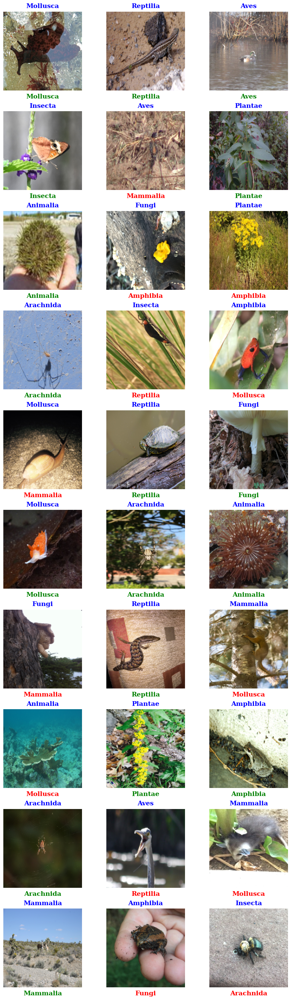

17

In [15]:

PARAM = {
    "image_size" : 224,
    "batch_size" : 64,
    "eta" : 0.001,
    "epochs" : 5,
    "output_size" : 10,
    "optimizer" : 'adam',
    "weight_decay" : 0,
    "strategy" : 'middle',
    "k" : 5, 
    "augmentation": "No",
}

model = load_model(device)
tuned_model = train_model(model, device, PARAM, 0, 1)
calculate_accuracy_on_test_data(tuned_model, device)
plot_grid(tuned_model, device)

## **Freeze Last k Layer (Except output Layer)**

Freeze last 5 layers and Train rest of the layers
Epoch 1, Training Loss: 1.7226173992156983, Training Accuracy: 46.4375%, Validation Loss: 1.6898274272680283, Validation Accuracy: 44.17208604302151%
Epoch 2, Training Loss: 1.2345273880958556, Training Accuracy: 65.8375%, Validation Loss: 1.564329069107771, Validation Accuracy: 48.57428714357179%
Epoch 3, Training Loss: 0.9242568964958191, Training Accuracy: 77.7625%, Validation Loss: 1.4266616515815258, Validation Accuracy: 54.97748874437219%
Test Accuracy : 57.2, Test Loss : 1.4092967771962286


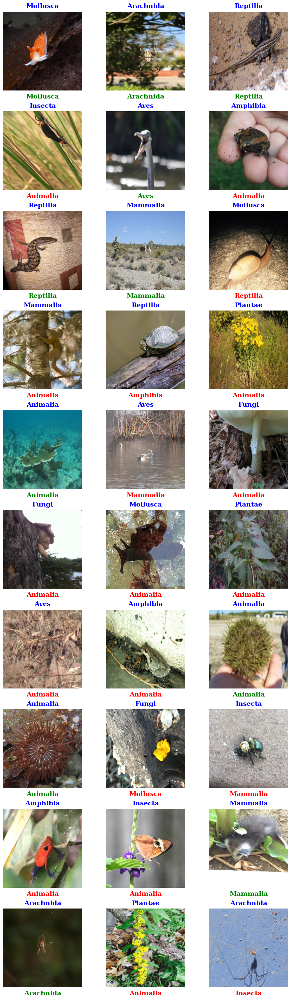

11

In [14]:

PARAM = {
    "image_size" : 224,
    "batch_size" : 64,
    "eta" : 0.001,
    "epochs" : 3,
    "output_size" : 10,
    "optimizer" : 'nadam',
    "weight_decay" : 0,
    "strategy" : 'end',
    "k" : 5, 
    "augmentation": "No",
}

model = load_model(device)
tuned_model = train_model(model, device, PARAM, 0, 1)
calculate_accuracy_on_test_data(tuned_model, device)
plot_grid(tuned_model, device)

## **Freeze all Layer and train only last layer**

Train only last layer and freeze all other layers
Epoch 1, Training Loss: 1.5513789615631104, Training Accuracy: 53.7875%, Validation Loss: 1.146598694846034, Validation Accuracy: 65.03251625812906%
Epoch 2, Training Loss: 1.1026120181083678, Training Accuracy: 65.625%, Validation Loss: 1.0244682282209396, Validation Accuracy: 68.23411705852926%
Epoch 3, Training Loss: 1.0100831022262573, Training Accuracy: 67.45%, Validation Loss: 0.9779306594282389, Validation Accuracy: 69.43471735867934%
Epoch 4, Training Loss: 0.9529136023521423, Training Accuracy: 69.2%, Validation Loss: 0.951649621129036, Validation Accuracy: 69.78489244622311%
Epoch 5, Training Loss: 0.9287840275764465, Training Accuracy: 69.3375%, Validation Loss: 0.9430976416915655, Validation Accuracy: 69.88494247123562%
Test Accuracy : 70.3, Test Loss : 0.9042532565967194


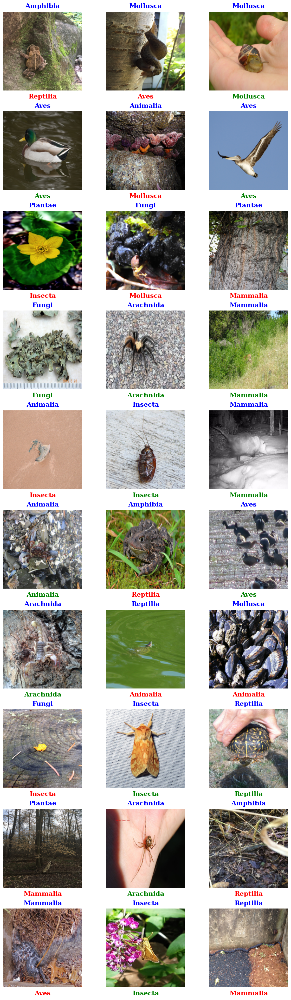

15

In [15]:
PARAM = {
    "image_size" : 224,
    "batch_size" : 64,
    "eta" : 0.001,
    "epochs" : 5,
    "output_size" : 10,
    "optimizer" : 'adam',
    "weight_decay" : 0,
    "strategy" : 'freeze_all',
    "k" : 17, 
    "augmentation": "No",
}

model = load_model(device)
tuned_model = train_model(model, device, PARAM, 0, 1)
calculate_accuracy_on_test_data(tuned_model, device)
plot_grid(tuned_model, device)